In [355]:
import pandas as pd
import warnings

warnings.filterwarnings("ignore", category=Warning)

weather = pd.read_csv("./data/kaggle/IndianWeatherRepository_new.csv",index_col='last_updated')

In [356]:
weather

,country,location_name,region,latitude,longitude,timezone,last_updated_epoch,temperature_celsius,temperature_fahrenheit,condition_text,...,air_quality_PM2.5,air_quality_PM10,air_quality_us-epa-index,air_quality_gb-defra-index,sunrise,sunset,moonrise,moonset,moon_phase,moon_illumination
last_updated,,,,,,,,,,,,,,,,,,,,,
2023-08-29 10:45,India,Ashoknagar,Madhya Pradesh,24.57,77.72,Asia/Kolkata,1693286100,27.5,81.5,Partly cloudy,...,12.6,18.5,1,2,05:59 AM,06:41 PM,05:42 PM,03:38 AM,Waxing Gibbous,93
2023-08-29 10:45,India,Raisen,Madhya Pradesh,23.33,77.80,Asia/Kolkata,1693286100,27.5,81.5,Sunny,...,10.7,14.2,1,1,06:00 AM,06:40 PM,05:39 PM,03:41 AM,Waxing Gibbous,93
2023-08-29 10:45,India,Chhindwara,Madhya Pradesh,22.07,78.93,Asia/Kolkata,1693286100,26.3,79.3,Partly cloudy,...,16.8,20.7,2,2,05:56 AM,06:34 PM,05:32 PM,03:39 AM,Waxing Gibbous,93
2023-08-29 10:45,India,Betul,Madhya Pradesh,21.86,77.93,Asia/Kolkata,1693286100,25.6,78.1,Cloudy,...,4.9,6.6,1,1,06:00 AM,06:38 PM,05:36 PM,03:43 AM,Waxing Gibbous,93
2023-08-29 10:45,India,Hoshangabad,Madhya Pradesh,22.75,77.72,Asia/Kolkata,1693286100,27.2,81.0,Cloudy,...,11.4,14.8,1,1,06:01 AM,06:39 PM,05:38 PM,03:42 AM,Waxing Gibbous,93
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2024-02-15 23:15,India,Niwari,Uttar Pradesh,28.88,77.53,Asia/Kolkata,1708019100,15.0,59.0,Mist,...,197.3,267.4,5,10,06:59 AM,06:09 PM,10:26 AM,No moonset,Waxing Crescent,32
2024-02-15 23:15,India,Saitual,Mizoram,23.97,92.58,Asia/Kolkata,1708019100,12.7,54.8,Clear,...,37.2,42.5,2,4,05:54 AM,05:15 PM,09:31 AM,11:01 PM,Waxing Crescent,32
2024-02-15 23:15,India,Ranipet,Tamil Nadu,12.93,79.33,Asia/Kolkata,1708019100,20.3,68.6,Clear,...,69.7,88.4,4,9,06:35 AM,06:18 PM,10:40 AM,11:39 PM,Waxing Crescent,32


In [357]:
#display column names
weather.columns

Index(['country', 'location_name', 'region', 'latitude', 'longitude',
       'timezone', 'last_updated_epoch', 'temperature_celsius',
       'temperature_fahrenheit', 'condition_text', 'wind_mph', 'wind_kph',
       'wind_degree', 'wind_direction', 'pressure_mb', 'pressure_in',
       'precip_mm', 'precip_in', 'humidity', 'cloud', 'feels_like_celsius',
       'feels_like_fahrenheit', 'visibility_km', 'visibility_miles',
       'uv_index', 'gust_mph', 'gust_kph', 'air_quality_Carbon_Monoxide',
       'air_quality_Ozone', 'air_quality_Nitrogen_dioxide',
       'air_quality_Sulphur_dioxide', 'air_quality_PM2.5', 'air_quality_PM10',
       'air_quality_us-epa-index', 'air_quality_gb-defra-index', 'sunrise',
       'sunset', 'moonrise', 'moonset', 'moon_phase', 'moon_illumination'],
      dtype='object')

In [358]:
weather.index

Index(['2023-08-29 10:45', '2023-08-29 10:45', '2023-08-29 10:45',
       '2023-08-29 10:45', '2023-08-29 10:45', '2023-08-29 10:45',
       '2023-08-29 10:45', '2023-08-29 10:45', '2023-08-29 10:45',
       '2023-08-29 10:45',
       ...
       '2024-02-15 23:15', '2024-02-15 23:15', '2024-02-15 23:15',
       '2024-02-15 23:15', '2024-02-15 23:15', '2024-02-15 23:15',
       '2024-02-15 23:15', '2024-02-15 23:15', '2024-02-15 23:15',
       '2024-02-15 23:15'],
      dtype='object', name='last_updated', length=91520)

### Preprocessing

In [359]:
#convert index to datetime
weather.index = pd.to_datetime(weather.index)
weather.index = weather.index.date

In [360]:
#change index column name
weather = weather.rename_axis('date')
weather.head()

,country,location_name,region,latitude,longitude,timezone,last_updated_epoch,temperature_celsius,temperature_fahrenheit,condition_text,...,air_quality_PM2.5,air_quality_PM10,air_quality_us-epa-index,air_quality_gb-defra-index,sunrise,sunset,moonrise,moonset,moon_phase,moon_illumination
date,,,,,,,,,,,,,,,,,,,,,
2023-08-29,India,Ashoknagar,Madhya Pradesh,24.57,77.72,Asia/Kolkata,1693286100,27.5,81.5,Partly cloudy,...,12.6,18.5,1,2,05:59 AM,06:41 PM,05:42 PM,03:38 AM,Waxing Gibbous,93
2023-08-29,India,Raisen,Madhya Pradesh,23.33,77.80,Asia/Kolkata,1693286100,27.5,81.5,Sunny,...,10.7,14.2,1,1,06:00 AM,06:40 PM,05:39 PM,03:41 AM,Waxing Gibbous,93
2023-08-29,India,Chhindwara,Madhya Pradesh,22.07,78.93,Asia/Kolkata,1693286100,26.3,79.3,Partly cloudy,...,16.8,20.7,2,2,05:56 AM,06:34 PM,05:32 PM,03:39 AM,Waxing Gibbous,93
2023-08-29,India,Betul,Madhya Pradesh,21.86,77.93,Asia/Kolkata,1693286100,25.6,78.1,Cloudy,...,4.9,6.6,1,1,06:00 AM,06:38 PM,05:36 PM,03:43 AM,Waxing Gibbous,93
2023-08-29,India,Hoshangabad,Madhya Pradesh,22.75,77.72,Asia/Kolkata,1693286100,27.2,81.0,Cloudy,...,11.4,14.8,1,1,06:01 AM,06:39 PM,05:38 PM,03:42 AM,Waxing Gibbous,93


In [361]:
#check for nulls
weather.isnull().sum()

country                         0
location_name                   0
region                          0
latitude                        0
longitude                       0
timezone                        0
last_updated_epoch              0
temperature_celsius             0
temperature_fahrenheit          0
condition_text                  0
wind_mph                        0
wind_kph                        0
wind_degree                     0
wind_direction                  0
pressure_mb                     0
pressure_in                     0
precip_mm                       0
precip_in                       0
humidity                        0
cloud                           0
feels_like_celsius              0
feels_like_fahrenheit           0
visibility_km                   0
visibility_miles                0
uv_index                        0
gust_mph                        0
gust_kph                        0
air_quality_Carbon_Monoxide     0
air_quality_Ozone               0
air_quality_Ni

In [362]:
#copy original data to new dataframe
weather_new = weather.copy()

#Removing redundant columns
weather_new.drop(['last_updated_epoch','temperature_fahrenheit','wind_mph','pressure_in','precip_mm','feels_like_fahrenheit','visibility_km','gust_mph'], 
                 axis=1,inplace=True)

In [363]:
weather_new.columns

Index(['country', 'location_name', 'region', 'latitude', 'longitude',
       'timezone', 'temperature_celsius', 'condition_text', 'wind_kph',
       'wind_degree', 'wind_direction', 'pressure_mb', 'precip_in', 'humidity',
       'cloud', 'feels_like_celsius', 'visibility_miles', 'uv_index',
       'gust_kph', 'air_quality_Carbon_Monoxide', 'air_quality_Ozone',
       'air_quality_Nitrogen_dioxide', 'air_quality_Sulphur_dioxide',
       'air_quality_PM2.5', 'air_quality_PM10', 'air_quality_us-epa-index',
       'air_quality_gb-defra-index', 'sunrise', 'sunset', 'moonrise',
       'moonset', 'moon_phase', 'moon_illumination'],
      dtype='object')

In [364]:
#create a dataframe for non numeric columns (i.e. object datatypes)
weather_obj = weather_new.select_dtypes(include='object')
weather_obj.head()

,country,location_name,region,timezone,condition_text,wind_direction,sunrise,sunset,moonrise,moonset,moon_phase
date,,,,,,,,,,,
2023-08-29,India,Ashoknagar,Madhya Pradesh,Asia/Kolkata,Partly cloudy,WNW,05:59 AM,06:41 PM,05:42 PM,03:38 AM,Waxing Gibbous
2023-08-29,India,Raisen,Madhya Pradesh,Asia/Kolkata,Sunny,WNW,06:00 AM,06:40 PM,05:39 PM,03:41 AM,Waxing Gibbous
2023-08-29,India,Chhindwara,Madhya Pradesh,Asia/Kolkata,Partly cloudy,NW,05:56 AM,06:34 PM,05:32 PM,03:39 AM,Waxing Gibbous
2023-08-29,India,Betul,Madhya Pradesh,Asia/Kolkata,Cloudy,WNW,06:00 AM,06:38 PM,05:36 PM,03:43 AM,Waxing Gibbous
2023-08-29,India,Hoshangabad,Madhya Pradesh,Asia/Kolkata,Cloudy,W,06:01 AM,06:39 PM,05:38 PM,03:42 AM,Waxing Gibbous


In [365]:
#creating a series of the object data types columns names
obj_cols = pd.Series(weather_obj.columns)
obj_cols

0            country
1      location_name
2             region
3           timezone
4     condition_text
5     wind_direction
6            sunrise
7             sunset
8           moonrise
9            moonset
10        moon_phase
dtype: object

In [366]:
#make a copy of weather_new
weather_num = weather_new.copy()

#remove object columns, leaving only numeric columns
weather_num.drop(columns=obj_cols,axis=1,inplace=True)
weather_num.columns

Index(['latitude', 'longitude', 'temperature_celsius', 'wind_kph',
       'wind_degree', 'pressure_mb', 'precip_in', 'humidity', 'cloud',
       'feels_like_celsius', 'visibility_miles', 'uv_index', 'gust_kph',
       'air_quality_Carbon_Monoxide', 'air_quality_Ozone',
       'air_quality_Nitrogen_dioxide', 'air_quality_Sulphur_dioxide',
       'air_quality_PM2.5', 'air_quality_PM10', 'air_quality_us-epa-index',
       'air_quality_gb-defra-index', 'moon_illumination'],
      dtype='object')

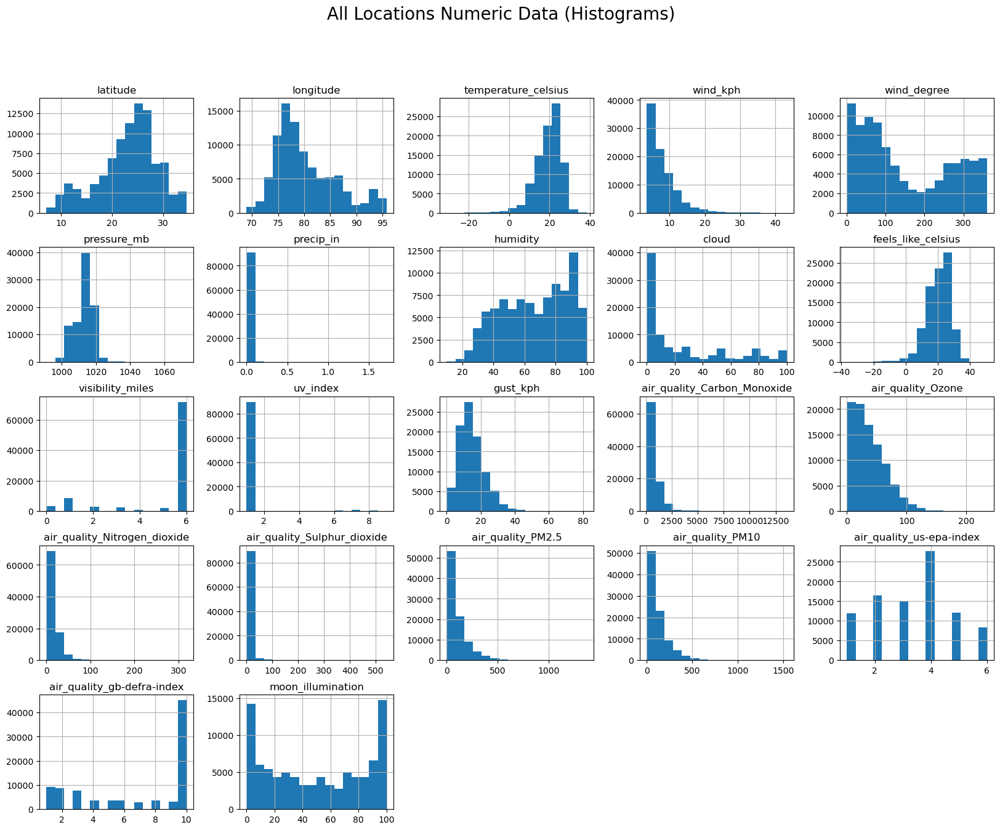

In [367]:
import matplotlib.pyplot as plt

#initial visual analysis (histograms) 
weather_num.hist(bins=16,figsize=(20,15));

plt.suptitle('All Locations Numeric Data (Histograms)', fontsize=20)
plt.savefig('hist_ALL.png')
plt.show()

In [368]:
#Dependent & Independent features for predicting Temperature
X_temp = weather_num[['latitude','longitude','wind_kph','wind_degree','pressure_mb','precip_in','humidity','cloud']]
y_temp = weather_num['temperature_celsius']

In [369]:
X_temp.shape, y_temp.shape

((91520, 8), (91520,))

In [370]:
y_train = y_temp.iloc[:-5000]
y_test = y_temp.iloc[-5000:]

y_train.shape, y_test.shape

((86520,), (5000,))

In [371]:
weather_num.index

Index([2023-08-29, 2023-08-29, 2023-08-29, 2023-08-29, 2023-08-29, 2023-08-29,
       2023-08-29, 2023-08-29, 2023-08-29, 2023-08-29,
       ...
       2024-02-15, 2024-02-15, 2024-02-15, 2024-02-15, 2024-02-15, 2024-02-15,
       2024-02-15, 2024-02-15, 2024-02-15, 2024-02-15],
      dtype='object', name='date', length=91520)

## Pune Weather

In [372]:
#creating df with only Pune data
weather_pune = weather_new.loc[weather_new["location_name"] == "Pune"]

In [373]:
print(weather_pune.columns)
weather_pune

Index(['country', 'location_name', 'region', 'latitude', 'longitude',
       'timezone', 'temperature_celsius', 'condition_text', 'wind_kph',
       'wind_degree', 'wind_direction', 'pressure_mb', 'precip_in', 'humidity',
       'cloud', 'feels_like_celsius', 'visibility_miles', 'uv_index',
       'gust_kph', 'air_quality_Carbon_Monoxide', 'air_quality_Ozone',
       'air_quality_Nitrogen_dioxide', 'air_quality_Sulphur_dioxide',
       'air_quality_PM2.5', 'air_quality_PM10', 'air_quality_us-epa-index',
       'air_quality_gb-defra-index', 'sunrise', 'sunset', 'moonrise',
       'moonset', 'moon_phase', 'moon_illumination'],
      dtype='object')


,country,location_name,region,latitude,longitude,timezone,temperature_celsius,condition_text,wind_kph,wind_degree,...,air_quality_PM2.5,air_quality_PM10,air_quality_us-epa-index,air_quality_gb-defra-index,sunrise,sunset,moonrise,moonset,moon_phase,moon_illumination
date,,,,,,,,,,,,,,,,,,,,,
2023-08-29,India,Pune,Maharashtra,18.53,73.87,Asia/Kolkata,26.4,Partly cloudy,15.8,270,...,4.6,6.9,1,1,06:19 AM,06:52 PM,05:46 PM,04:07 AM,Waxing Gibbous,93
2023-08-30,India,Pune,Maharashtra,18.53,73.87,Asia/Kolkata,25.3,Sunny,8.3,278,...,5.6,9.9,1,1,06:19 AM,06:51 PM,06:35 PM,05:16 AM,Full Moon,98
2023-08-31,India,Pune,Maharashtra,18.53,73.87,Asia/Kolkata,21.1,Partly cloudy,6.8,290,...,13.7,18.5,1,2,06:19 AM,06:51 PM,06:35 PM,05:16 AM,Full Moon,98
2023-09-01,India,Pune,Maharashtra,18.53,73.87,Asia/Kolkata,23.4,Partly cloudy,8.3,293,...,28.4,36.9,2,3,06:19 AM,06:50 PM,07:20 PM,06:21 AM,Waning Gibbous,100
2023-09-02,India,Pune,Maharashtra,18.53,73.87,Asia/Kolkata,24.8,Partly cloudy,5.8,283,...,23.3,30.6,2,2,06:20 AM,06:49 PM,08:01 PM,07:25 AM,Waning Gibbous,99
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2024-02-11,India,Pune,Maharashtra,18.53,73.87,Asia/Kolkata,21.6,Clear,8.3,290,...,168.6,194.4,5,10,07:05 AM,06:33 PM,08:12 AM,08:10 PM,Waxing Crescent,2
2024-02-12,India,Pune,Maharashtra,18.53,73.87,Asia/Kolkata,22.0,Clear,8.6,289,...,215.4,241.1,5,10,07:04 AM,06:33 PM,08:54 AM,09:12 PM,Waxing Crescent,6
2024-02-13,India,Pune,Maharashtra,18.53,73.87,Asia/Kolkata,22.2,Clear,8.6,288,...,257.9,292.7,6,10,07:04 AM,06:34 PM,09:35 AM,10:11 PM,Waxing Crescent,13


In [374]:
#copy of Pune data for numeric data only
weather_pune_num = weather_pune.copy()

#removing non numeric columns from Pune data
weather_pune_num.drop(columns=obj_cols,axis=1,inplace=True)
#removing latitude & longitude
weather_pune_num = weather_pune_num.drop(['latitude','longitude'],axis=1)

In [375]:
#Numeric Pune data
print(weather_pune_num.columns)

Index(['temperature_celsius', 'wind_kph', 'wind_degree', 'pressure_mb',
       'precip_in', 'humidity', 'cloud', 'feels_like_celsius',
       'visibility_miles', 'uv_index', 'gust_kph',
       'air_quality_Carbon_Monoxide', 'air_quality_Ozone',
       'air_quality_Nitrogen_dioxide', 'air_quality_Sulphur_dioxide',
       'air_quality_PM2.5', 'air_quality_PM10', 'air_quality_us-epa-index',
       'air_quality_gb-defra-index', 'moon_illumination'],
      dtype='object')


In [376]:
weather_pune_num.index = pd.to_datetime(weather_pune_num.index)
weather_pune_num.index

DatetimeIndex(['2023-08-29', '2023-08-30', '2023-08-31', '2023-09-01',
               '2023-09-02', '2023-09-03', '2023-09-04', '2023-09-05',
               '2023-09-06', '2023-09-07',
               ...
               '2024-02-06', '2024-02-07', '2024-02-08', '2024-02-09',
               '2024-02-10', '2024-02-11', '2024-02-12', '2024-02-13',
               '2024-02-14', '2024-02-15'],
              dtype='datetime64[ns]', name='date', length=167, freq=None)

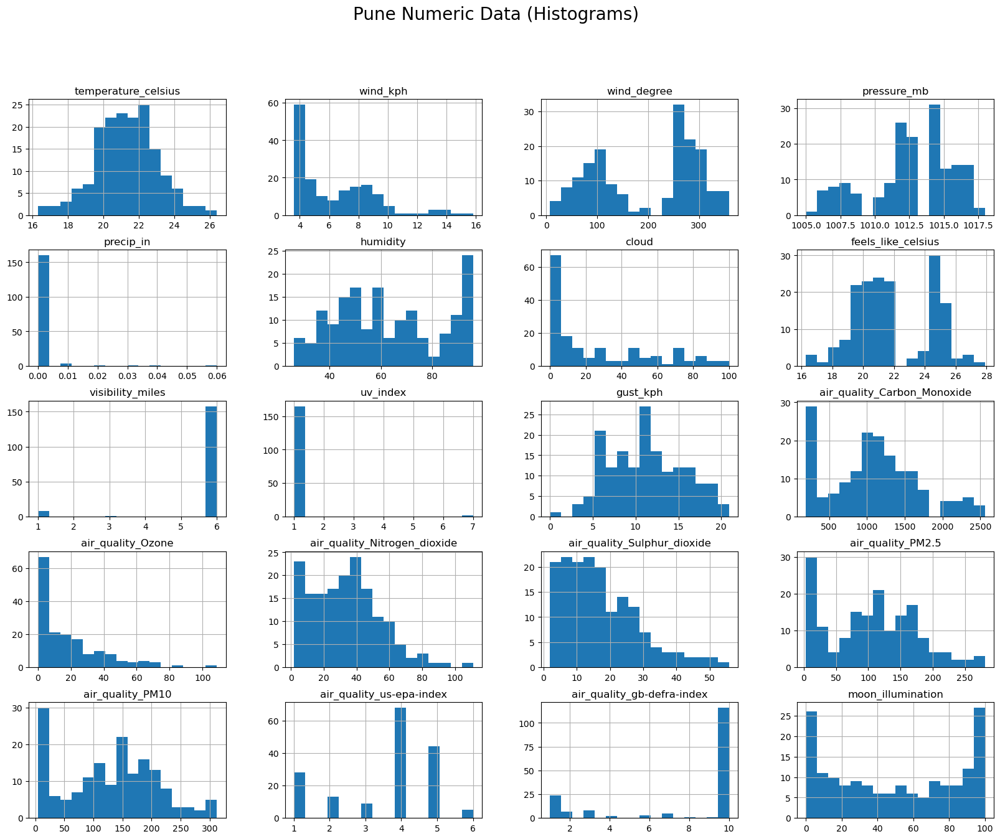

In [377]:
#initial visual analysis (histograms)
weather_pune_num.hist(bins=16,figsize=(20,15));

plt.suptitle('Pune Numeric Data (Histograms)', fontsize=20)
plt.savefig('init_hist_pune.png')
plt.show()

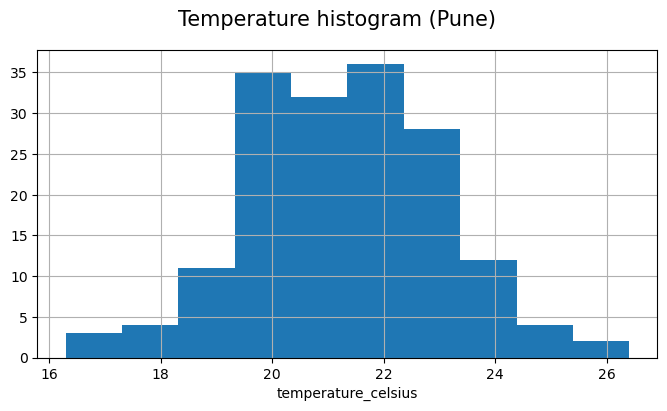

In [378]:
#plotting histogram of temperature_celsius colum

weather_pune_num["temperature_celsius"].hist();

plt.suptitle('Temperature histogram (Pune)', fontsize=15)
plt.xlabel('temperature_celsius')
plt.savefig('pune_temp_cel_hist.png')
plt.show()

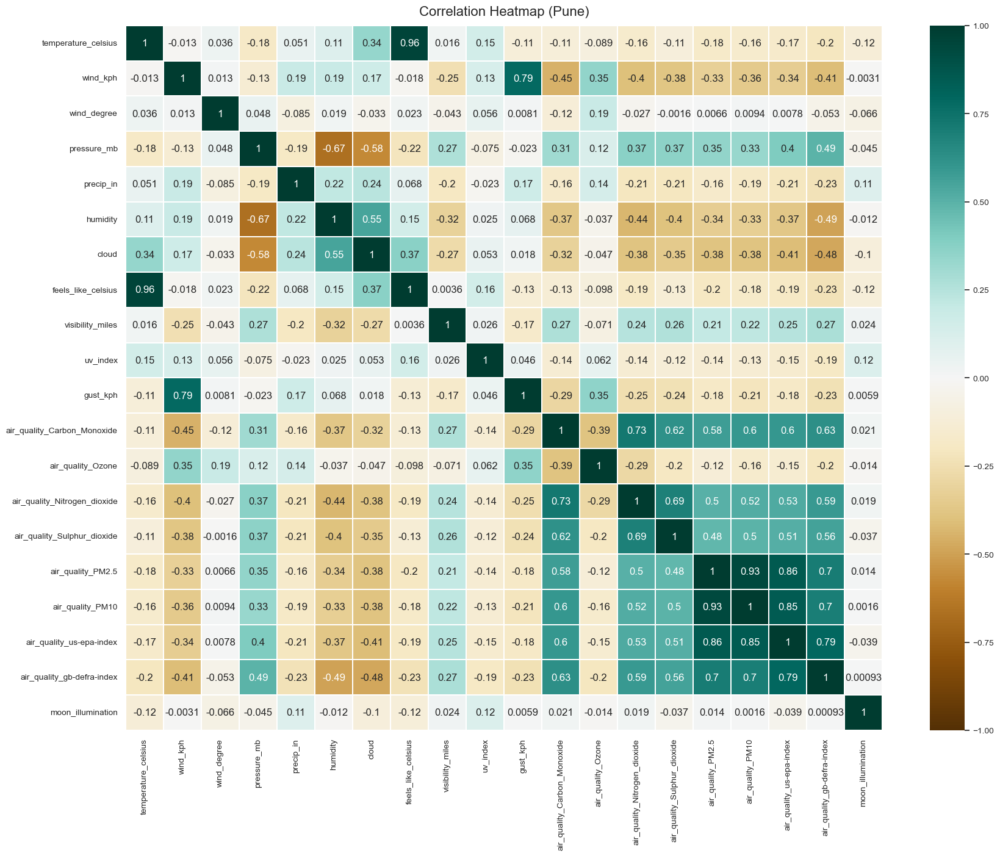

In [379]:
#Correlation Heatmap Visualization for Pune

import seaborn as sns

#Creating a correlation matrix for Pune data
sns.set(font_scale=0.9)

weather_pune_corr = weather_pune_num.corr(method="kendall")

plt.figure(figsize=(20, 15))
heatmap= sns.heatmap(weather_pune_corr, vmin=-1, vmax=1, annot=True,cmap='BrBG',annot_kws={"fontsize":12},linewidths=0.1)
heatmap.set_title('Correlation Heatmap (Pune)', fontdict={'fontsize':16}, pad=12);

plt.savefig('corr_heatmap_pune.png')

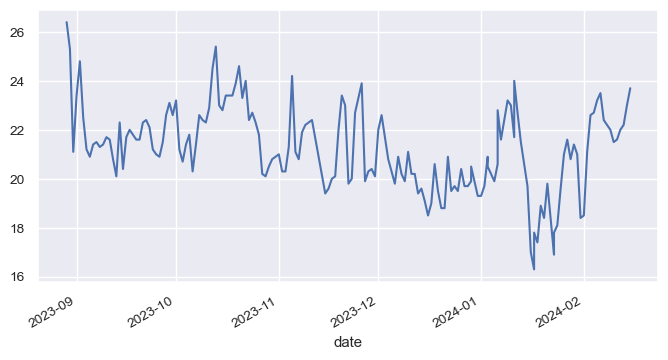

In [380]:
#plotting Pune's temperature
weather_pune_num["temperature_celsius"].plot();

In [381]:
temp_stationary = weather_pune_num[['temperature_celsius']].copy()

temp_stationary = temp_stationary.reset_index()

temp_stationary

,date,temperature_celsius
0,2023-08-29,26.4
1,2023-08-30,25.3
2,2023-08-31,21.1
3,2023-09-01,23.4
4,2023-09-02,24.8
...,...,...
162,2024-02-11,21.6
163,2024-02-12,22.0
164,2024-02-13,22.2
165,2024-02-14,23.0


In [382]:
import plotly.express as px

def plotting(title,data,x,y,x_label,y_label):
    fig = px.line(data, x=data[x],y=data[y], labels={x: x_label, y: y_label})

    fig.update_layout(template="simple_white", font=dict(size=18),title_text=title, width=650,title_x=0.5,height=400)
    fig.show()

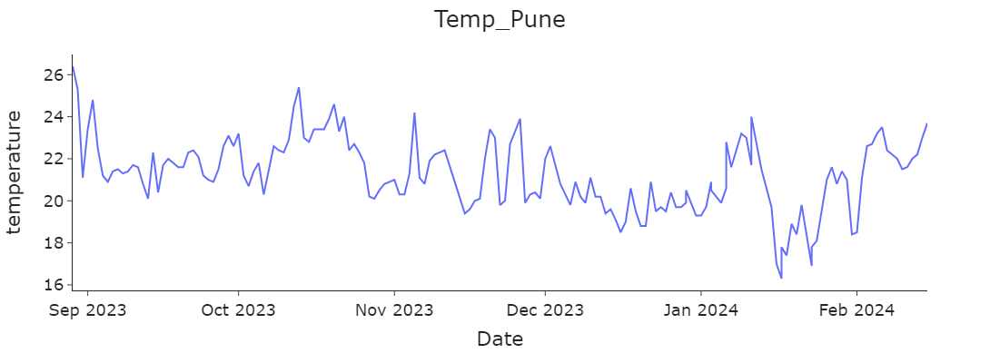

In [383]:
plotting(title='Temp_Pune', data=temp_stationary, x='date', y='temperature_celsius', x_label='Date', y_label='temperature')

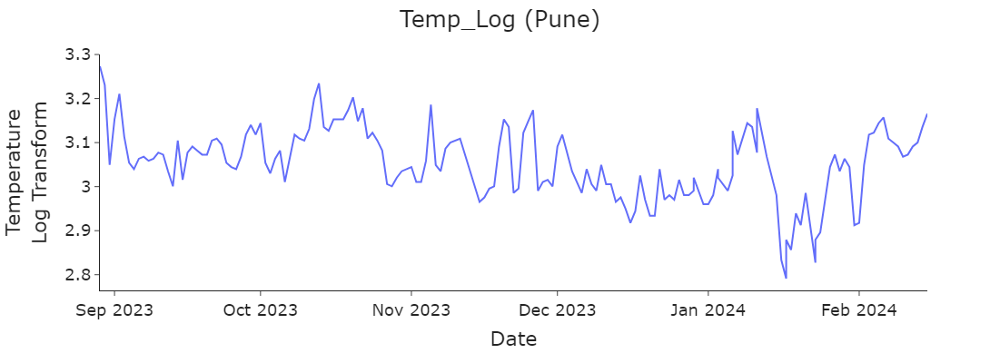

In [384]:
import numpy as np

temp_stationary["Temp_Log"] = np.log(temp_stationary["temperature_celsius"])

plotting(title='Temp_Log (Pune)', data=temp_stationary, x='date', y='Temp_Log', x_label='Date', y_label='Temperature<br>Log Transform')

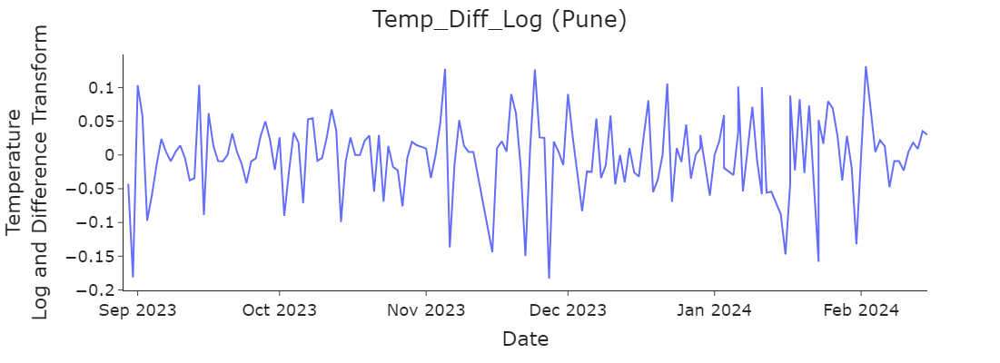

In [385]:
#note: take log first then difference of the log
temp_stationary["Temp_Diff_Log"] = temp_stationary["Temp_Log"].diff() #taking difference of the logs

plotting(title='Temp_Diff_Log (Pune)', data=temp_stationary, x='date', y='Temp_Diff_Log', x_label='Date', y_label='Temperature<br>Log and Difference Transform')

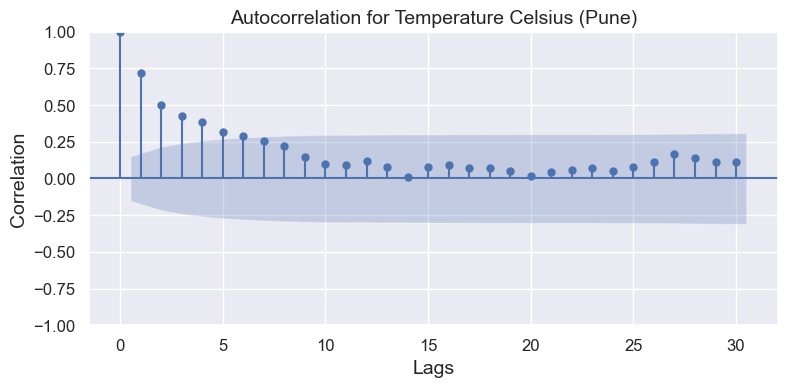

In [386]:
#find autocorrelation of temperature_celsius 

from statsmodels.graphics.tsaplots import plot_acf

# Plot autocorrelation for Pune data
plt.rc("figure",figsize=(8,4))
plot_acf(temp_stationary['temperature_celsius'], lags=30)
plt.ylim(-1,1)
plt.xlabel('Lags', fontsize=14)
plt.ylabel('Correlation',fontsize=14)
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)
plt.title('Autocorrelation for Temperature Celsius (Pune)',fontsize=14)
plt.tight_layout()
plt.show()

In [387]:
#getting date from index
weather_pune_temp = weather_pune_num.copy()

weather_pune_temp = weather_pune_temp.reset_index()

In [388]:
weather_pune_temp = weather_pune_temp[['date','temperature_celsius']]
print(weather_pune_temp)

          date  temperature_celsius
0   2023-08-29                 26.4
1   2023-08-30                 25.3
2   2023-08-31                 21.1
3   2023-09-01                 23.4
4   2023-09-02                 24.8
..         ...                  ...
162 2024-02-11                 21.6
163 2024-02-12                 22.0
164 2024-02-13                 22.2
165 2024-02-14                 23.0
166 2024-02-15                 23.7

[167 rows x 2 columns]


In [389]:
import plotly.graph_objects as go
from statsmodels.tsa.holtwinters import ExponentialSmoothing

#splitting 20% of the data to test
train = temp_stationary.iloc[:-int(len(temp_stationary) * 0.2)]
test = temp_stationary.iloc[-int(len(temp_stationary) * 0.2):]

In [390]:
# function to plot and forecast

def plot_func(forecast: list[float],
              title: str) -> None:
    """Function to plot the forecasts."""
    fig = go.Figure()
    fig.add_trace(go.Scatter(x=train['date'], y=train['temperature_celsius'], name='Train'))
    fig.add_trace(go.Scatter(x=test['date'], y=test['temperature_celsius'], name='Test'))
    fig.add_trace(go.Scatter(x=test['date'], y=forecast, name='Forecast'))
    fig.update_layout(template="simple_white", font=dict(size=18), title_text=title,
                      width=700, title_x=0.5, height=400, xaxis_title='Date',
                      yaxis_title='Temperature (celsius)')
    return fig.show()

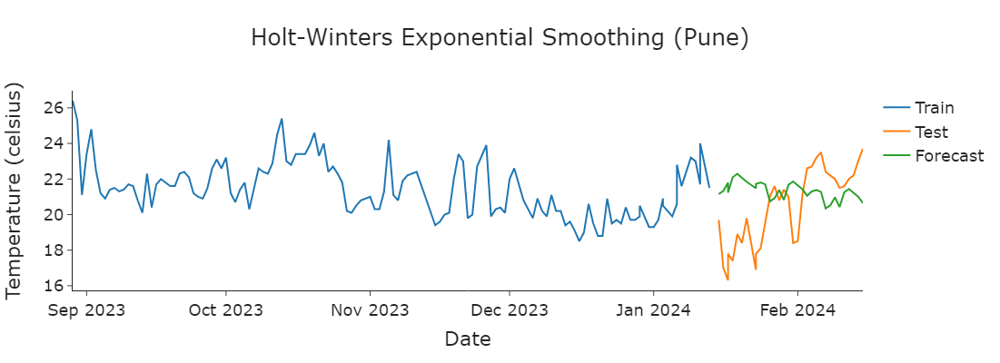

In [391]:
# Fit Holt Winters model and get forecasts
model = ExponentialSmoothing(train['temperature_celsius'], trend='mul', seasonal='mul', seasonal_periods=12).fit(optimized=True)
forecasts = model.forecast(len(test))

# Plot the forecasts
plot_func(forecasts,  "Holt-Winters Exponential Smoothing (Pune)")

In [392]:
print(model.summary())

                       ExponentialSmoothing Model Results                       
Dep. Variable:      temperature_celsius   No. Observations:                  134
Model:             ExponentialSmoothing   SSE                            156.244
Optimized:                         True   AIC                             52.580
Trend:                   Multiplicative   BIC                             98.945
Seasonal:                Multiplicative   AICC                            58.528
Seasonal Periods:                    12   Date:                 Fri, 16 Feb 2024
Box-Cox:                          False   Time:                         12:54:11
Box-Cox Coeff.:                    None                                         
                          coeff                 code              optimized      
---------------------------------------------------------------------------------
smoothing_level               0.5357855                alpha                 True
smoothing_trend          

In [393]:
# Appending residuals and fitted values to the train dataframe to show the difference
train["fittedvalues"] = model.fittedvalues
train["residuals"] = model.resid
print(train)

          date  temperature_celsius  Temp_Log  Temp_Diff_Log  fittedvalues  \
0   2023-08-29                 26.4  3.273364            NaN     25.506191   
1   2023-08-30                 25.3  3.230804      -0.042560     25.855960   
2   2023-08-31                 21.1  3.049273      -0.181531     24.438142   
3   2023-09-01                 23.4  3.152736       0.103463     22.838339   
4   2023-09-02                 24.8  3.210844       0.058108     23.648933   
..         ...                  ...       ...            ...           ...   
129 2024-01-10                 23.0  3.135494      -0.008658     22.250163   
130 2024-01-11                 21.7  3.077312      -0.058182     22.267820   
131 2024-01-11                 24.0  3.178054       0.100742     22.214421   
132 2024-01-12                 22.7  3.122365      -0.055689     23.262859   
133 2024-01-13                 21.5  3.068053      -0.054312     22.847192   

     residuals  
0     0.893809  
1    -0.555960  
2    -3.3381

In [394]:
from sklearn.metrics import mean_squared_error as mse
from numpy import sqrt 

#Root Mean Squared Error of the forecast
error = round(sqrt(mse(test['temperature_celsius'], forecasts)),2)
print("Root Mean Squared Error= "+str(error))

Root Mean Squared Error= 2.63


In [395]:
train_ar = train.set_index('date')
test_ar = test.set_index('date')

train_ar = train_ar['temperature_celsius']
test_ar = test_ar['temperature_celsius']

Performing stepwise search to minimize aic
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=inf, Time=0.42 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=433.315, Time=0.01 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=432.154, Time=0.02 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=424.758, Time=0.04 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=431.437, Time=0.01 sec
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=417.468, Time=0.15 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=413.016, Time=0.11 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=418.466, Time=0.05 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=414.819, Time=0.13 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=414.745, Time=0.11 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=414.702, Time=0.08 sec
 ARIMA(3,1,2)(0,0,0)[0] intercept   : AIC=411.782, Time=0.48 sec
 ARIMA(4,1,2)(0,0,0)[0] intercept   : AIC=inf, Time=0.72 sec
 ARIMA(3,1,3)(0,0,0)[0] intercept   : AIC=inf, Time=0.64 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=inf, Time=0.55 se

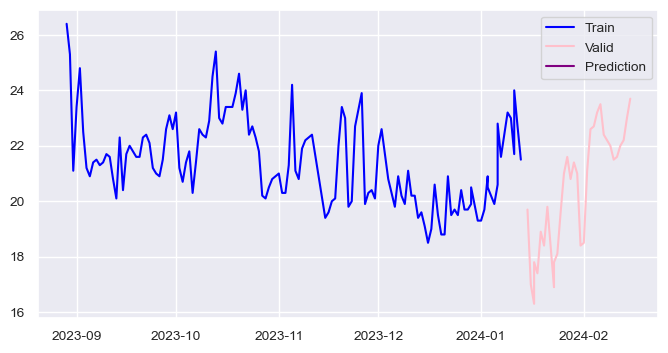

In [405]:
#Auto_arima model

from pmdarima.arima import auto_arima

model = auto_arima(train_ar, trace=True,error_action='ignore',suppress_warnings=True)

print(model.summary())

forecast = model.predict(n_periods=len(test_ar))
forecast = pd.DataFrame(forecast,index=y_test.index,columns=['Prediction'])

plt.plot(train_ar, label='Train',color='blue')
plt.plot(test_ar, label='Valid',color='pink')
plt.plot(forecast, label='Prediction',color='purple')
plt.legend(loc='best')
plt.show()

## MUMBAI

In [407]:
#creating df with only Mumbai data
weather_mumbai = weather_new.loc[weather_new["location_name"] == "Mumbai"]

In [408]:
print(weather_mumbai.columns)
weather_mumbai

Index(['country', 'location_name', 'region', 'latitude', 'longitude',
       'timezone', 'temperature_celsius', 'condition_text', 'wind_kph',
       'wind_degree', 'wind_direction', 'pressure_mb', 'precip_in', 'humidity',
       'cloud', 'feels_like_celsius', 'visibility_miles', 'uv_index',
       'gust_kph', 'air_quality_Carbon_Monoxide', 'air_quality_Ozone',
       'air_quality_Nitrogen_dioxide', 'air_quality_Sulphur_dioxide',
       'air_quality_PM2.5', 'air_quality_PM10', 'air_quality_us-epa-index',
       'air_quality_gb-defra-index', 'sunrise', 'sunset', 'moonrise',
       'moonset', 'moon_phase', 'moon_illumination'],
      dtype='object')


,country,location_name,region,latitude,longitude,timezone,temperature_celsius,condition_text,wind_kph,wind_degree,...,air_quality_PM2.5,air_quality_PM10,air_quality_us-epa-index,air_quality_gb-defra-index,sunrise,sunset,moonrise,moonset,moon_phase,moon_illumination
date,,,,,,,,,,,,,,,,,,,,,
2023-08-29,India,Mumbai,Maharashtra,18.98,72.83,Asia/Kolkata,27.0,Moderate or heavy rain shower,13.0,260,...,16.3,23.7,2,2,06:23 AM,06:56 PM,05:51 PM,04:11 AM,Waxing Gibbous,93
2023-08-30,India,Mumbai,Maharashtra,18.98,72.83,Asia/Kolkata,28.0,Mist,6.8,140,...,38.2,56.1,2,4,06:23 AM,06:55 PM,06:40 PM,05:19 AM,Full Moon,98
2023-08-31,India,Mumbai,Maharashtra,18.98,72.83,Asia/Kolkata,27.0,Mist,6.8,80,...,22.9,33.4,2,2,06:23 AM,06:55 PM,06:40 PM,05:19 AM,Full Moon,98
2023-08-31,India,Mumbai,Maharashtra,18.98,72.83,Asia/Kolkata,26.9,Clear,3.6,152,...,22.9,33.4,2,2,06:23 AM,06:55 PM,06:40 PM,05:19 AM,Full Moon,98
2023-09-01,India,Mumbai,Maharashtra,18.98,72.83,Asia/Kolkata,29.0,Mist,6.8,320,...,51.8,72.7,3,6,06:23 AM,06:55 PM,07:25 PM,06:25 AM,Waning Gibbous,100
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2024-02-11,India,Mumbai,Maharashtra,18.98,72.83,Asia/Kolkata,26.0,Overcast,6.1,190,...,161.1,212.3,5,10,07:09 AM,06:37 PM,08:17 AM,08:14 PM,Waxing Crescent,2
2024-02-12,India,Mumbai,Maharashtra,18.98,72.83,Asia/Kolkata,25.0,Clear,14.8,352,...,276.4,347.0,6,10,07:09 AM,06:37 PM,08:59 AM,09:16 PM,Waxing Crescent,6
2024-02-13,India,Mumbai,Maharashtra,18.98,72.83,Asia/Kolkata,25.0,Clear,18.4,352,...,340.5,410.1,6,10,07:08 AM,06:38 PM,09:39 AM,10:16 PM,Waxing Crescent,13


In [409]:
#copy of Mumbai data for numeric data only
weather_mumbai_num = weather_mumbai.copy()

#removing non numeric columns from Pune data
weather_mumbai_num.drop(columns=obj_cols,axis=1,inplace=True)
#removing latitude & longitude
weather_mumbai_num = weather_mumbai_num.drop(['latitude','longitude'],axis=1)

In [410]:
#Numeric Pune data
print(weather_mumbai_num.columns)

Index(['temperature_celsius', 'wind_kph', 'wind_degree', 'pressure_mb',
       'precip_in', 'humidity', 'cloud', 'feels_like_celsius',
       'visibility_miles', 'uv_index', 'gust_kph',
       'air_quality_Carbon_Monoxide', 'air_quality_Ozone',
       'air_quality_Nitrogen_dioxide', 'air_quality_Sulphur_dioxide',
       'air_quality_PM2.5', 'air_quality_PM10', 'air_quality_us-epa-index',
       'air_quality_gb-defra-index', 'moon_illumination'],
      dtype='object')


In [411]:
#converting date col to datetime
weather_mumbai_num.index = pd.to_datetime(weather_mumbai_num.index)
weather_mumbai_num.index

DatetimeIndex(['2023-08-29', '2023-08-30', '2023-08-31', '2023-08-31',
               '2023-09-01', '2023-09-01', '2023-09-02', '2023-09-03',
               '2023-09-04', '2023-09-05',
               ...
               '2024-02-07', '2024-02-07', '2024-02-08', '2024-02-09',
               '2024-02-10', '2024-02-11', '2024-02-12', '2024-02-13',
               '2024-02-14', '2024-02-15'],
              dtype='datetime64[ns]', name='date', length=190, freq=None)

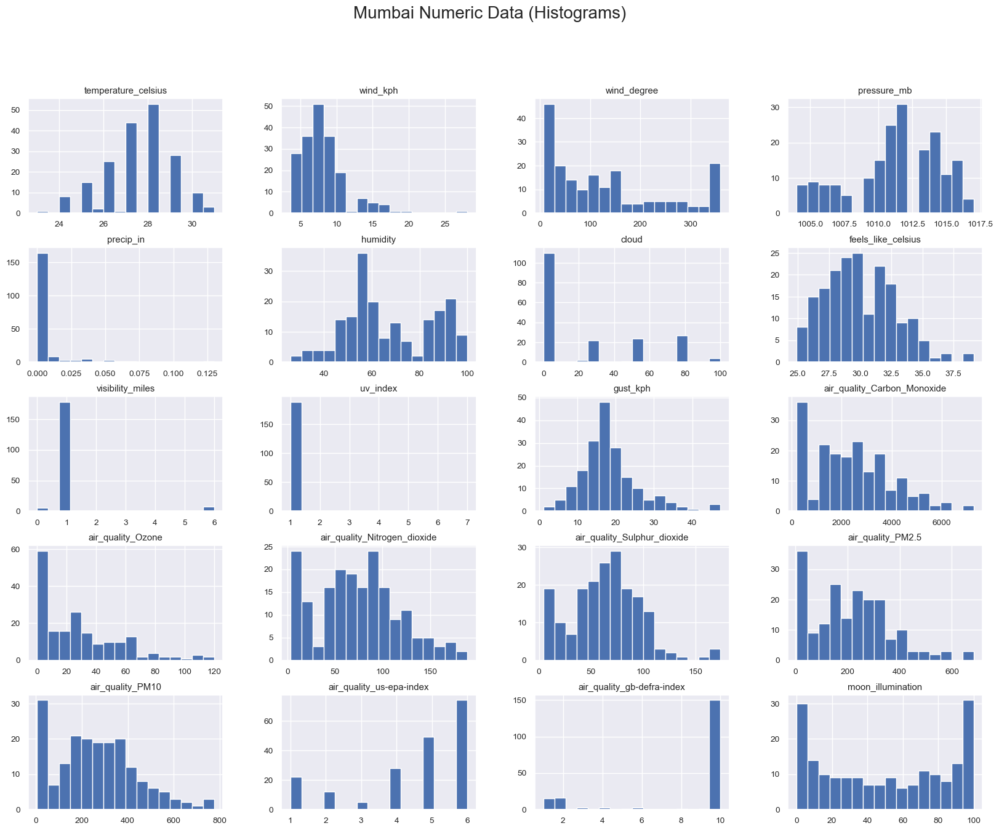

In [412]:
#initial visual analysis (histograms)
weather_mumbai_num.hist(bins=16,figsize=(20,15));

plt.suptitle('Mumbai Numeric Data (Histograms)', fontsize=20)
plt.savefig('init_hist_mumbai.png')
plt.show()

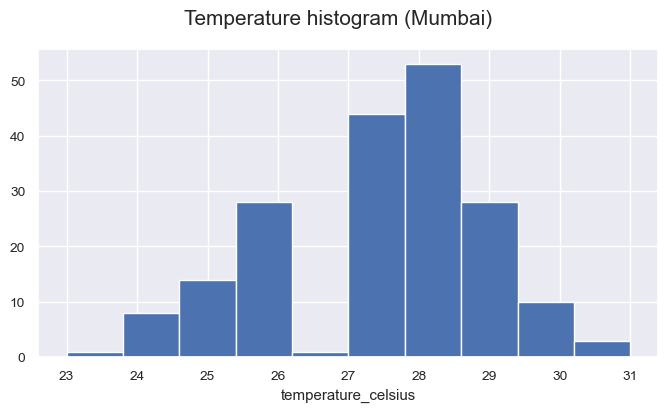

In [413]:
#plotting histogram of temperature_celsius colum

weather_mumbai_num["temperature_celsius"].hist();

plt.suptitle('Temperature histogram (Mumbai)', fontsize=15)
plt.xlabel('temperature_celsius')
plt.savefig('mumbai_temp_cel_hist.png')
plt.show()

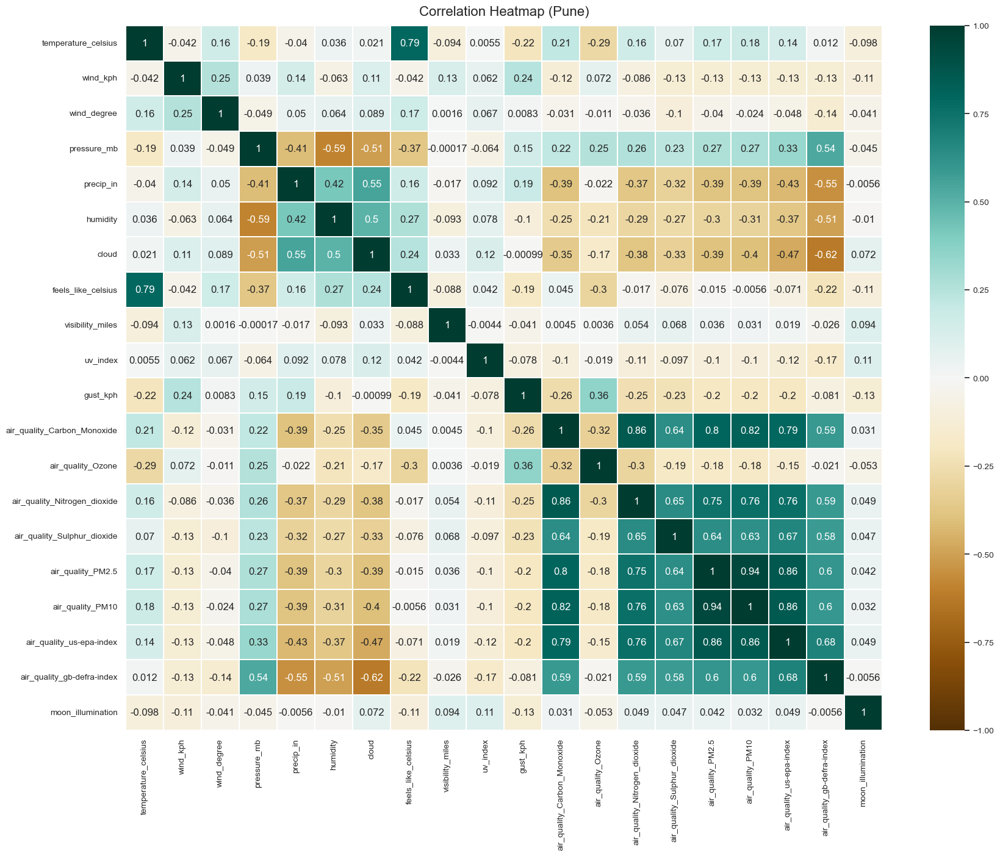

In [414]:
#Correlation Heatmap Visualization for Mumbai

import seaborn as sns

#Creating a correlation matrix for Mumbai data
sns.set(font_scale=0.9)

weather_mumbai_corr = weather_mumbai_num.corr(method="kendall")

plt.figure(figsize=(20, 15))
heatmap= sns.heatmap(weather_mumbai_corr, vmin=-1, vmax=1, annot=True,cmap='BrBG',annot_kws={"fontsize":12},linewidths=0.1)
heatmap.set_title('Correlation Heatmap (Mumbai)', fontdict={'fontsize':16}, pad=12);

plt.savefig('corr_heatmap_mumbai.png')

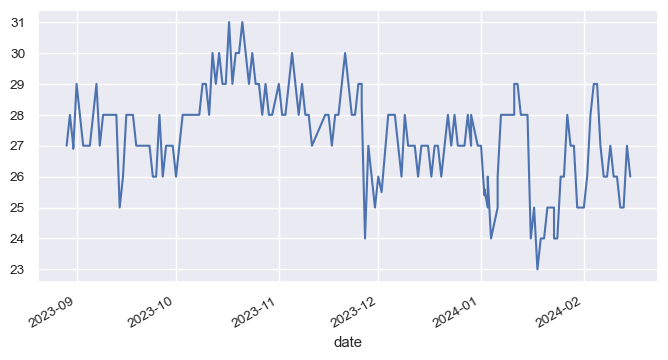

In [415]:
#plotting Pune's temperature
weather_mumbai_num["temperature_celsius"].plot();

In [416]:
temp_stationary_mumbai = weather_mumbai_num[['temperature_celsius']].copy()

temp_stationary_mumbai = temp_stationary_mumbai.reset_index()

temp_stationary_mumbai

,date,temperature_celsius
0,2023-08-29,27.0
1,2023-08-30,28.0
2,2023-08-31,27.0
3,2023-08-31,26.9
4,2023-09-01,29.0
...,...,...
185,2024-02-11,26.0
186,2024-02-12,25.0
187,2024-02-13,25.0
188,2024-02-14,27.0


In [417]:
import plotly.express as px

def plotting(title,data,x,y,x_label,y_label):
    fig = px.line(data, x=data[x],y=data[y], labels={x: x_label, y: y_label})

    fig.update_layout(template="simple_white", font=dict(size=18),title_text=title, width=650,title_x=0.5,height=400)
    fig.show()

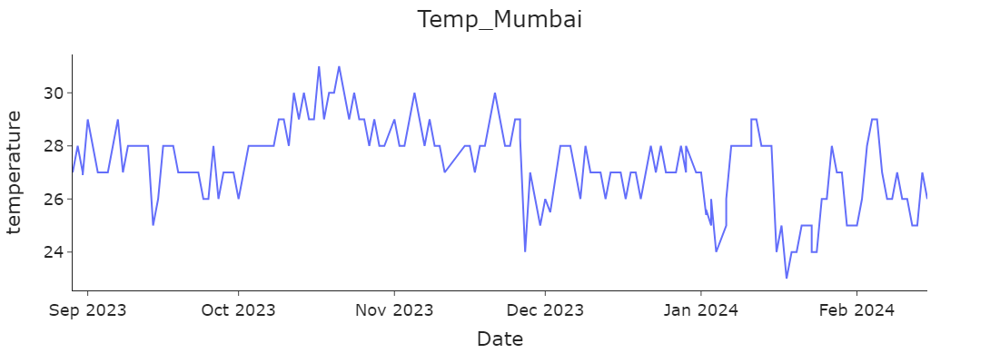

In [418]:
plotting(title='Temp_Mumbai', data=temp_stationary_mumbai, x='date', y='temperature_celsius', x_label='Date', y_label='temperature')

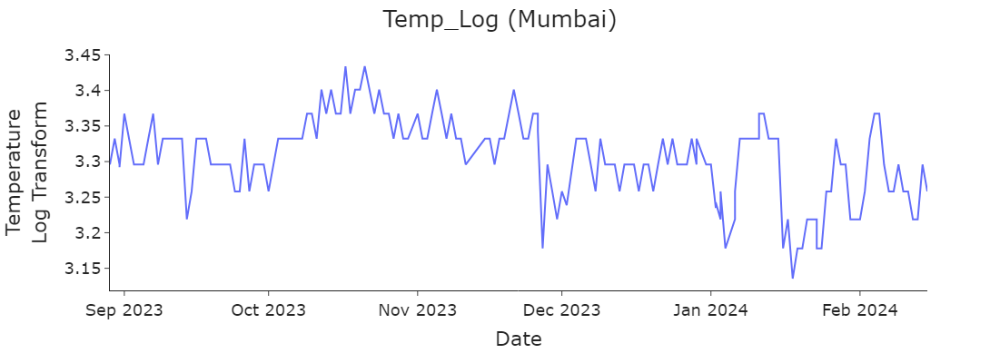

In [419]:
import numpy as np

temp_stationary_mumbai["Temp_Log"] = np.log(temp_stationary_mumbai["temperature_celsius"])

plotting(title='Temp_Log (Mumbai)', data=temp_stationary_mumbai, x='date', y='Temp_Log', x_label='Date', y_label='Temperature<br>Log Transform')

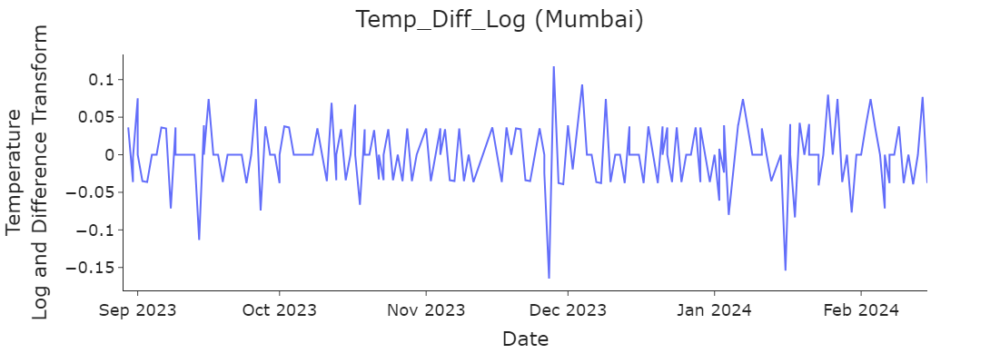

In [420]:
#note: take log first then difference of the log
temp_stationary_mumbai["Temp_Diff_Log"] = temp_stationary_mumbai["Temp_Log"].diff() #taking difference of the logs

plotting(title='Temp_Diff_Log (Mumbai)', data=temp_stationary_mumbai, x='date', y='Temp_Diff_Log', x_label='Date', y_label='Temperature<br>Log and Difference Transform')

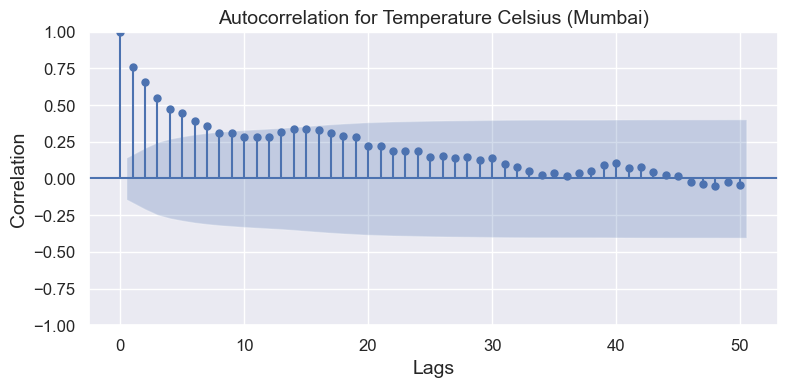

In [422]:
#find autocorrelation of temperature_celsius 

from statsmodels.graphics.tsaplots import plot_acf

# Plot autocorrelation for Mumbai data
plt.rc("figure",figsize=(8,4))
plot_acf(temp_stationary_mumbai['temperature_celsius'], lags=50)
plt.ylim(-1,1)
plt.xlabel('Lags', fontsize=14)
plt.ylabel('Correlation',fontsize=14)
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)
plt.title('Autocorrelation for Temperature Celsius (Mumbai)',fontsize=14)
plt.tight_layout()
plt.show()

In [426]:
#copying df and resetting index
weather_mumbai_temp = weather_mumbai_num.copy()

weather_mumbai_temp = weather_mumbai_temp.reset_index()

In [428]:
#creating df with only date & temperature_celsius
weather_mumbai_temp = weather_mumbai_temp[['date','temperature_celsius']]
print(weather_mumbai_temp)

          date  temperature_celsius
0   2023-08-29                 27.0
1   2023-08-30                 28.0
2   2023-08-31                 27.0
3   2023-08-31                 26.9
4   2023-09-01                 29.0
..         ...                  ...
185 2024-02-11                 26.0
186 2024-02-12                 25.0
187 2024-02-13                 25.0
188 2024-02-14                 27.0
189 2024-02-15                 26.0

[190 rows x 2 columns]


In [436]:
import plotly.graph_objects as go
from statsmodels.tsa.holtwinters import ExponentialSmoothing

#splitting 20% of the data to test
train_m = temp_stationary_mumbai.iloc[:-int(len(temp_stationary_mumbai) * 0.2)]
test_m = temp_stationary_mumbai.iloc[-int(len(temp_stationary_mumbai) * 0.2):]

In [437]:
# function to plot and forecast

def plot_func(forecast: list[float],
              title: str) -> None:
    """Function to plot the forecasts."""
    fig = go.Figure()
    fig.add_trace(go.Scatter(x=train_m['date'], y=train_m['temperature_celsius'], name='Train'))
    fig.add_trace(go.Scatter(x=test_m['date'], y=test_m['temperature_celsius'], name='Test'))
    fig.add_trace(go.Scatter(x=test_m['date'], y=forecast, name='Forecast'))
    fig.update_layout(template="simple_white", font=dict(size=18), title_text=title,
                      width=700, title_x=0.5, height=400, xaxis_title='Date',
                      yaxis_title='Temperature (celsius)')
    return fig.show()

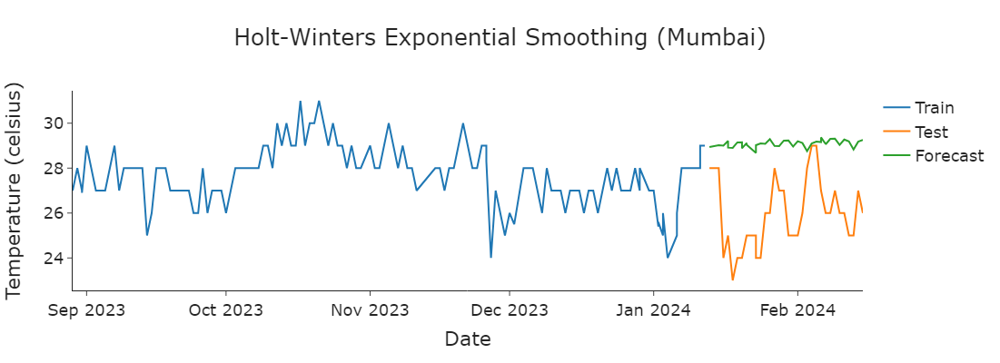

In [444]:
# Fit Holt Winters model and get forecasts
model = ExponentialSmoothing(train_m['temperature_celsius'], trend='mul', seasonal='mul', seasonal_periods=12).fit(optimized=True)
forecasts = model.forecast(len(test_m))

# Plot the forecasts
plot_func(forecasts,  "Holt-Winters Exponential Smoothing (Mumbai)")

In [439]:
print(model.summary())

                       ExponentialSmoothing Model Results                       
Dep. Variable:      temperature_celsius   No. Observations:                  152
Model:             ExponentialSmoothing   SSE                            130.537
Optimized:                         True   AIC                              8.862
Trend:                   Multiplicative   BIC                             57.244
Seasonal:                Multiplicative   AICC                            14.005
Seasonal Periods:                    12   Date:                 Fri, 16 Feb 2024
Box-Cox:                          False   Time:                         14:00:38
Box-Cox Coeff.:                    None                                         
                          coeff                 code              optimized      
---------------------------------------------------------------------------------
smoothing_level               0.5406488                alpha                 True
smoothing_trend          

In [443]:
test_m.shape, forecasts.shape

((38, 4), (33,))

In [445]:
from sklearn.metrics import mean_squared_error as mse
from numpy import sqrt 

#Root Mean Squared Error of the forecast
error = round(sqrt(mse(test_m['temperature_celsius'], forecasts)),2)
print("Root Mean Squared Error= "+str(error))

Root Mean Squared Error= 3.53


In [446]:
train_mumbai_ar = train_m.set_index('date')
test_mumbai_ar = test_m.set_index('date')

train_mumbai_ar = train_mumbai_ar['temperature_celsius']
test_mumbai_ar = test_mumbai_ar['temperature_celsius']

Performing stepwise search to minimize aic
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=inf, Time=0.48 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=441.104, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=424.946, Time=0.04 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=418.104, Time=0.07 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=439.129, Time=0.03 sec
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=418.063, Time=0.10 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=418.440, Time=0.15 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=inf, Time=0.47 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=418.811, Time=0.10 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=423.334, Time=0.05 sec
 ARIMA(1,1,1)(0,0,0)[0]             : AIC=416.090, Time=0.06 sec
 ARIMA(0,1,1)(0,0,0)[0]             : AIC=416.158, Time=0.05 sec
 ARIMA(1,1,0)(0,0,0)[0]             : AIC=422.985, Time=0.04 sec
 ARIMA(2,1,1)(0,0,0)[0]             : AIC=416.442, Time=0.15 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=inf, Time=0.2

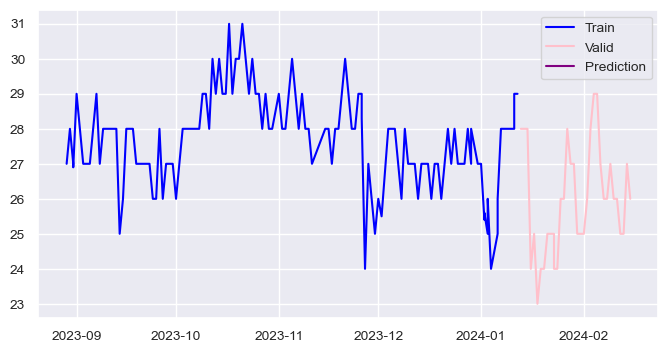

In [448]:
#Auto_arima model

from pmdarima.arima import auto_arima

model = auto_arima(train_mumbai_ar, trace=True,error_action='ignore',suppress_warnings=True)

print(model.summary())

forecast = model.predict(n_periods=len(test_mumbai_ar))
forecast = pd.DataFrame(forecast,index=test_mumbai_ar.index,columns=['Prediction'])

plt.plot(train_mumbai_ar, label='Train',color='blue')
plt.plot(test_mumbai_ar, label='Valid',color='pink')
plt.plot(forecast, label='Prediction',color='purple')
plt.legend(loc='best')
plt.show()

In [453]:
# sort by temperature celsius descending 
weather_new = weather_new.sort_values(by='temperature_celsius', ascending=False)
weather_new.head() #top 5 highest temperatures

,country,location_name,region,latitude,longitude,timezone,temperature_celsius,condition_text,wind_kph,wind_degree,...,air_quality_PM2.5,air_quality_PM10,air_quality_us-epa-index,air_quality_gb-defra-index,sunrise,sunset,moonrise,moonset,moon_phase,moon_illumination
date,,,,,,,,,,,,,,,,,,,,,
2023-09-14,India,Bikaner,Rajasthan,28.02,73.30,Asia/Kolkata,38.3,Partly cloudy,4.7,22,...,23.7,91.2,2,2,06:21 AM,06:43 PM,05:31 AM,06:34 PM,New Moon,1
2023-09-14,India,Fazilka,Punjab,30.40,74.03,Asia/Kolkata,36.3,Clear,12.2,110,...,101.5,116.5,4,10,06:17 AM,06:41 PM,05:25 AM,06:33 PM,New Moon,1
2023-09-14,India,Ganganagar,Rajasthan,29.92,73.88,Asia/Kolkata,36.3,Partly cloudy,8.6,113,...,96.7,110.2,4,10,06:18 AM,06:42 PM,05:26 AM,06:33 PM,New Moon,1
2023-09-14,India,Hanumangarh,Rajasthan,29.58,74.32,Asia/Kolkata,35.6,Clear,17.3,123,...,74.8,84.1,4,10,06:16 AM,06:40 PM,05:25 AM,06:31 PM,New Moon,1
2023-08-29,India,Nellore,Andhra Pradesh,14.43,79.97,Asia/Kolkata,35.3,Patchy rain possible,24.8,306,...,8.2,10.8,1,1,05:58 AM,06:24 PM,05:14 PM,03:50 AM,Waxing Gibbous,93


## Top 5 Locations with highest average temperature

In [461]:
# Top 5 locations with highest average temperature
average_temperature_by_location = weather_new.groupby('location_name')['temperature_celsius'].mean().reset_index()

# Sort the DataFrame by average temperature in descending order
sorted_data = average_temperature_by_location.sort_values(by='temperature_celsius', ascending=False)

# Select the top 5 locations with highest average temperature
top_5_locations = sorted_data.head(5)
top_5_locations

,location_name,temperature_celsius
271,Kavaratti,27.844311
350,Moshoit,27.720000
508,Thiruvananthapuram,27.573054
155,Enounga,27.572727
352,Mumbai,27.345789


# State-Wise

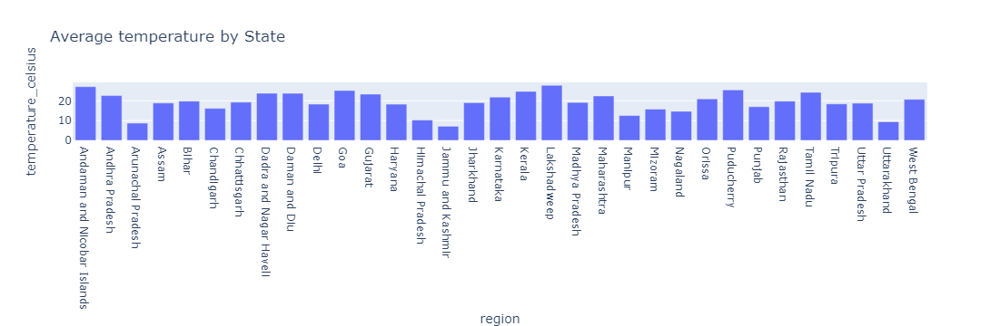

In [450]:
fig4=px.bar(weather_new.groupby('region')['temperature_celsius'].mean().reset_index(), x='region', 
            y='temperature_celsius', title='Average temperature by State')
fig4.show()

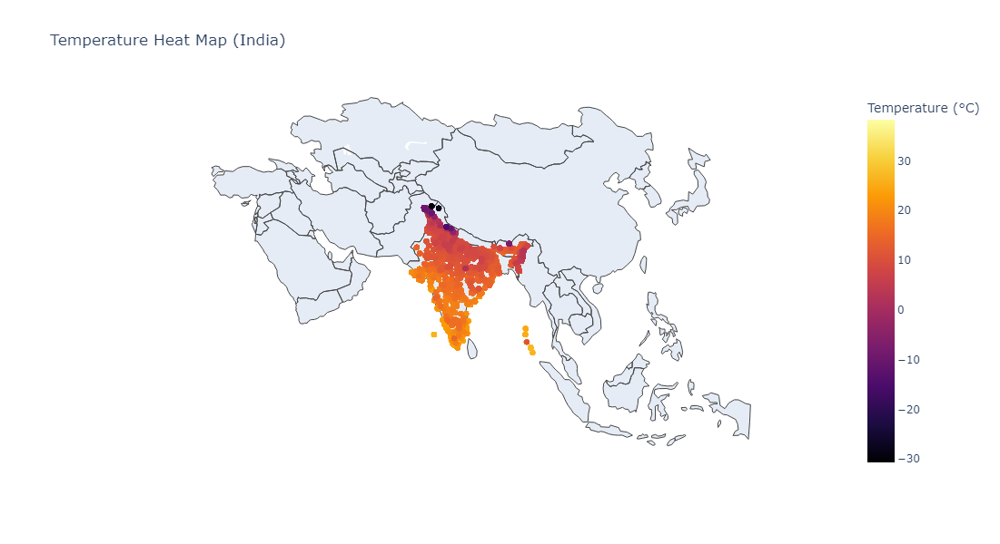

In [509]:
import plotly.express as px

fig = px.scatter_geo(
    weather_new,
    lat='latitude',
    lon='longitude',
    color='temperature_celsius',
    title='Temperature Heat Map (India)',
    projection='natural earth',  
    color_continuous_scale='Inferno',  
    center={'lat': 20.5937, 'lon': 78.9629},
    scope = 'asia',
    hover_data=['location_name', 'temperature_celsius'],  
    labels={'location_name': 'Location', 'temperature_celsius': 'Temperature (°C)'}
)


fig.update_layout( width=950, height=600)

# Show the plot
fig.show()